These are some basic utility functions we will need. 

In [9]:
from __future__ import division
from collections import Counter, defaultdict
import os, math, random, re, glob #Imports a bunch of modules we will need

#
# data splitting
#

def split_data(data, prob):
    """split data into fractions [prob, 1 - prob]"""
    results = [], []
    for row in data:
        results[0 if random.random() < prob else 1].append(row)
    return results

def train_test_split(x, y, test_pct):
    data = zip(x, y)                              # pair corresponding values ; zip combines lists to tuples
    train, test = split_data(data, 1 - test_pct)  # split the dataset of pairs
    x_train, y_train = zip(*train)                # magical un-zip trick
    x_test, y_test = zip(*test)
    return x_train, x_test, y_train, y_test

# NAIVE BAYES

## Naive Bayes from Scratch

First, let's build a Naive Bayes classifier from scratch. This example drawn from *Data Science from Scratch* by Joel Grus. 

### Mathematical Preliminaries

Recall the key independence assumption of Naive Bayes: $P(X_1 = x_1,\dots,X_n = x_n\,|\,S) = P(X_1 = x_1\,|\,S)\times \dots 
    \times P(X_n = x_n\,|\,S)$

To be concrete, let's assume we are building a spam filter. 

Given a vocabulary $w_1,\dots,w_n$, let $X_i$ be the event "message contains $w_i$." $X_i = x_i, x_i \in \{0,1\}$. 

$S$ is the event "message is spam" and $\neg S$ is the event "message is not spam."

According to Bayes' Theorem 

$P(S\,|\,X_1 = x_1,\dots, X_n = x_n) = \frac{P(X_1 = x_1,\dots, X_n = x_n\,|\,S)P(S)}{P(X_1 = x_1,\dots, X_n = x_n)} = \frac{P(X_1 = x_1,\dots, X_n = x_n\,|\,S)P(S)}{P(X_1 = x_1,\dots, X_n = x_n\,|\,S)P(S)\, + \,P(X_1 = x_1,\dots, X_n = x_n\,|\,\neg S)P(\neg S)}$

We further assume that we have no knowledge of the prior probability of spam; so $P(S) = P(\neg S) = 0.5$ (this is the principle of indifference)

With this simplification, $P(S\,|\,X_1 = x_1,\dots, X_n = x_n) = \frac{P(X_1 = x_1,\dots, X_n = x_n\,|\,S)}{P(X_1 = x_1,\dots, X_n = x_n\,|\,S)\, +\, P(X_1 = x_1,\dots, X_n = x_n\,|\,\neg S)}$ 

Now we make the Naive Bayes assumption: $P(X_1 = x_1,\dots,X_n = x_n\,|\,S) = P(X_1 = x_1\,|\,S)\times \dots 
    \times P(X_n = x_n\,|\,S)$
    
We can estimate $P(X_i = x_i\,|\,S)$ by computing the fraction of spam messages containing the word $i$, e.g., Obamacare. 

Smoothing: $P(X_i\,|\,S) = \frac{(k + \textrm{number of spams containing}\, w_i)}{(2k + \textrm{number of spams})}$



### Now we are going to code this up

First we will "tokenize" our input, i.e., turn text into presence/absence of words. 

In [2]:
def tokenize(message): #Note: no stemming
    message = message.lower() # convert to lowercase
    all_words = re.findall("[a-z0-9']+", message) # use re to extract the words
    return set(all_words) # remove duplicates because we are creating a set

Now we need to count the number of times each word shows up in spam and non-spam

In [3]:
def count_words(training_set):
    """training set consists of pairs (message, is_spam)""" 
    counts = defaultdict(lambda: [0, 0]) #This is a tricky bit of Python magic, makes a dictionary initialized to [0,0]
    for message, is_spam in training_set: #Here I step through the training set.
        for word in tokenize(message): 
            counts[word][0 if is_spam else 1] += 1
    return counts

We need a function to convert these counts into (smoothed) probabilities

In [4]:
def word_probabilities(counts, total_spams, total_non_spams, k=0.5): #What is the smoothing parameter?
    """turn the word_counts into a list of triplets 
    w, p(w | spam) and p(w | ~spam)"""
    return [(w,
             (spam + k) / (total_spams + 2 * k),
             (non_spam + k) / (total_non_spams + 2 * k)) #This uses list comprehension. 
             for w, (spam, non_spam) in counts.items()]  #Replace .iteritems with .items for Python3

Now we need to come up with a way to compute the spam probability for a message, given word probabilities. With the Naive Bayes assumption, we *would* be multiplying together a bunch of probabilities. This is bad (underflow) so we compute:

$p_1 *\dots*p_n = \exp(\, \log(p_1) + \dots + \log(p_n)\,)$; recall $\log(ab) = \log a + \log b$ and $\exp(\, \log x \,) = x$

Thank you, John Napier (1550-1617)

In [5]:
def spam_probability(word_probs, message):
    message_words = tokenize(message)
    log_prob_if_spam = log_prob_if_not_spam = 0.0 #Initialize; we are working with log probs to deal with underflow.

    for word, prob_if_spam, prob_if_not_spam in word_probs: #We iterate over all possible words we've observed

        # for each word in the message, 
        # add the log probability of seeing it 
        if word in message_words:
            log_prob_if_spam += math.log(prob_if_spam) #This is prob of seeing word if spam
            log_prob_if_not_spam += math.log(prob_if_not_spam) #This is prob of seeing word if not spam

        # for each word that's not in the message
        # add the log probability of _not_ seeing it
        else:
            log_prob_if_spam += math.log(1.0 - prob_if_spam)
            log_prob_if_not_spam += math.log(1.0 - prob_if_not_spam)
            
    prob_if_spam = math.exp(log_prob_if_spam) #Compute numerator
    prob_if_not_spam = math.exp(log_prob_if_not_spam)
    return prob_if_spam / (prob_if_spam + prob_if_not_spam) #Compute whole thing and return

Think: how would this change if $P(S) \neq P(\neg S)$

Now we write a class (this is a Python term) for our Naive Bayes Classifier

In [6]:
class NaiveBayesClassifier:

    def __init__(self, k=0.5):
        self.k = k
        self.word_probs = [] #Initializes word_probs as an empty list, sets a default smoothing parameters

    def train(self, training_set): #Operates on the training_set
    
        # count spam and non-spam messages: first step of training
        num_spams = len([is_spam 
                         for message, is_spam in training_set 
                         if is_spam]) #This is also list comprehension
        num_non_spams = len(training_set) - num_spams

        # run training data through our "pipeline"
        word_counts = count_words(training_set)
        self.word_probs = word_probabilities(word_counts, 
                                             num_spams, 
                                             num_non_spams,
                                             self.k) #"Train" classifier 
                                             
    def classify(self, message):
        return spam_probability(self.word_probs, message) #Now we have all we need to classify a message


We'll need a special utility function for reading in the data

In [7]:
def get_subject_data(path):

    data = []

    # regex for stripping out the leading "Subject:" and any spaces after it
    subject_regex = re.compile(r"^Subject:\s+")

    # glob.glob returns every filename that matches the wildcarded path
    for fn in glob.glob(path):
        is_spam = "ham" not in fn
        
        with open(fn,'r') as file: #PYTHON 3 USERS: COMMENT THIS OUT AND USE LINE BELOW
        #with open(fn,'r',errors='surrogateescape') as file: 
            for line in file:
                if line.startswith("Subject:"):
                    subject = subject_regex.sub("", line).strip()
                    data.append((subject, is_spam))

    return data

Grab data from: https://spamassassin.apache.org/publiccorpus/

Get the ones with 20021010 prefixes and put them into the data folder under the current working directory.

In [10]:
path = os.getcwd() + '/data/*/*/*'

In [11]:
data = get_subject_data(path)

In [12]:
len(data) #How many 

3423

In [13]:
data[1000] #Let's look

('Re: The 3rd Annual Consult Hyperion Digital Identity Forum', False)

To train the model, we'll need to split our data into training & test

In [14]:
random.seed(0) #This is important for replicability
train_data,test_data = split_data(data,0.75) #Recall what the second argument does here

In [15]:
classifier = NaiveBayesClassifier() #Create an instance of our classifier

In [16]:
classifier.train(train_data) #Train the classifier on the training data

In [17]:
len(train_data)

2547

Some simple evaluation:

In [18]:
# triplets (subject, actual is_spam, predicted spam probability)
classified = [(subject, is_spam, classifier.classify(subject))
              for subject, is_spam in test_data]

# assume that spam_probability > 0.5 corresponds to spam prediction # and count the combinations of (actual is_spam, predicted is_spam)
counts = Counter((is_spam, spam_probability > 0.5) # (actual, predicted)
                     for _, is_spam, spam_probability in classified)

In [19]:
counts #Let's see how we did!

Counter({(False, False): 704,
         (False, True): 33,
         (True, False): 38,
         (True, True): 101})

In [20]:
precision = counts[(True,True)]/(counts[(False,True)]+counts[(True,True)]) #True positives over all positive predictions
print(precision)

0.753731343284


In [21]:
recall = counts[(True,True)]/(counts[(True,False)]+counts[(True,True)])#what fraction of positives identified
print(recall)

0.726618705036


**Think**: what will happen if I change my spam threshold from 0.5?

**Think**: what decision rule are we using, when we assign the class label $\hat{y} = S$ when $P(S\,|\,X_1\dots X_n) = \frac{P(S)\prod_i P(X_i = x_i|S)}{P(\textbf{X})} > 0.5$

**Think**: what will happen if I split the data differently (e.g., less training data, more testing data). Try it!

We can also find words that lead to a high probability of spam (using Bayes' Theorem):

In [22]:
def p_spam_given_word(word_prob):
    """uses bayes's theorem to compute p(spam | message contains word)"""
    # word_prob is one of the triplets produced by word_probabilities

    word, prob_if_spam, prob_if_not_spam = word_prob
    return prob_if_spam / (prob_if_spam + prob_if_not_spam)

In [23]:
words = sorted(classifier.word_probs,key=p_spam_given_word)

In [24]:
spammiest_words = words[-15:]
hammiest_words = words[:15]

In [25]:
spammiest_words

[('account', 0.01780821917808219, 0.00022893772893772894),
 ('95', 0.02054794520547945, 0.00022893772893772894),
 ('29', 0.02054794520547945, 0.00022893772893772894),
 ('per', 0.02054794520547945, 0.00022893772893772894),
 ('norton', 0.02054794520547945, 0.00022893772893772894),
 ('mortgage', 0.023287671232876714, 0.00022893772893772894),
 ('guaranteed', 0.023287671232876714, 0.00022893772893772894),
 ('zzzz', 0.026027397260273973, 0.00022893772893772894),
 ('clearance', 0.026027397260273973, 0.00022893772893772894),
 ('adv', 0.026027397260273973, 0.00022893772893772894),
 ('year', 0.028767123287671233, 0.00022893772893772894),
 ('sale', 0.031506849315068496, 0.00022893772893772894),
 ('rates', 0.031506849315068496, 0.00022893772893772894),
 ('systemworks', 0.036986301369863014, 0.00022893772893772894),
 ('money', 0.03972602739726028, 0.00022893772893772894)]

In [26]:
hammiest_words

[('spambayes', 0.0013698630136986301, 0.04601648351648352),
 ('users', 0.0013698630136986301, 0.036401098901098904),
 ('razor', 0.0013698630136986301, 0.030906593406593408),
 ('zzzzteana', 0.0013698630136986301, 0.029075091575091576),
 ('sadev', 0.0013698630136986301, 0.026785714285714284),
 ('ouch', 0.0013698630136986301, 0.02358058608058608),
 ('bliss', 0.0013698630136986301, 0.021749084249084248),
 ('selling', 0.0013698630136986301, 0.021291208791208792),
 ('wedded', 0.0013698630136986301, 0.021291208791208792),
 ('apt', 0.0013698630136986301, 0.021291208791208792),
 ('perl', 0.0013698630136986301, 0.0190018315018315),
 ('spamassassin', 0.0013698630136986301, 0.018543956043956044),
 ('satalk', 0.00410958904109589, 0.053800366300366304),
 ('problem', 0.0013698630136986301, 0.017170329670329672),
 ('alsa', 0.0013698630136986301, 0.016712454212454212)]

## Naive Bayes with Scikit-Learn

The examples here are drawn from the *Python Data Science Handbook* by Jake VanderPlas.

### Gaussian Naive Bayes

This is applied to continuous quantitative features.  The generative model here assumes that data for each label are drawn from Gaussian distributions. We want to figure out the parameters of those distributions. If we assume no covariance between the dimensions, we just find the mean and standard deviation (in each dimension) of the training data in each label. 

In [27]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns; sns.set()

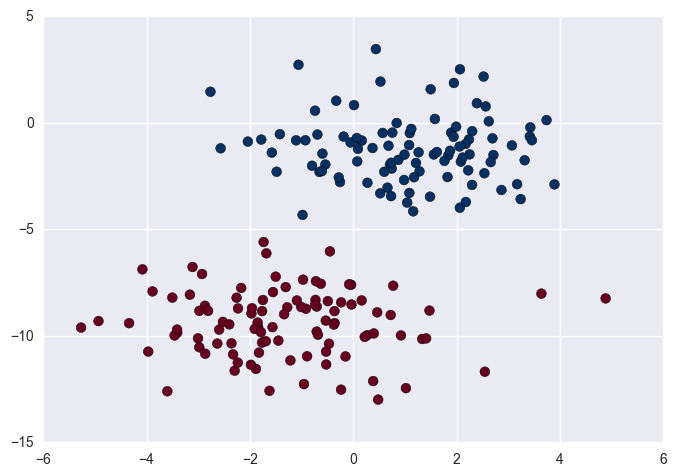

In [28]:
from sklearn.datasets import make_blobs
X, y = make_blobs(200, 2, centers=2, random_state=2, cluster_std=1.5) #Number of points, number of features (dimensions)
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='RdBu');
#plt.axis([-9,9,-14,4])

**Think**: What happens if you change the random state? Centers? Cluster_std?

Note that these really are isotropic... They just are skewed by the plotting. Try using the commented line
to change axes.

Now let's fit ("learn") the Gaussian Naive Bayes model.

In [29]:
from sklearn.naive_bayes import GaussianNB #Choose class of model
model = GaussianNB() #No hyperparameters
model.fit(X, y) #Fit the model with fit() method

GaussianNB()

To see how this is working, let's see how a bunch of random points are classified:

In [30]:
rng = np.random.RandomState(0) #Initialize a random number generator
Xnew = [-6, -14] + [14, 18] * rng.rand(2000, 2) #These values specially chosen to fill this plane
ynew = model.predict(Xnew)

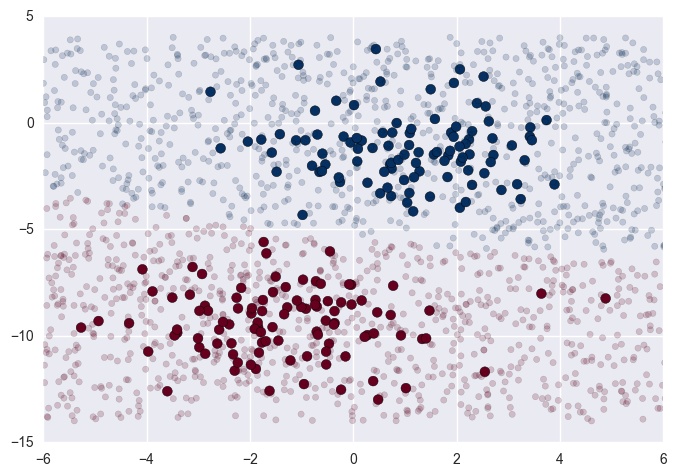

In [31]:
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='RdBu')
lim = plt.axis()
plt.scatter(Xnew[:, 0], Xnew[:, 1], c=ynew, s=20, cmap='RdBu', alpha=0.2)
plt.axis(lim);

In [32]:
yprob = model.predict_proba(Xnew) #Use this method to examine posterior probabilities of labels
yprob[-8:].round(2)

array([[ 0.99,  0.01],
       [ 1.  ,  0.  ],
       [ 1.  ,  0.  ],
       [ 1.  ,  0.  ],
       [ 1.  ,  0.  ],
       [ 1.  ,  0.  ],
       [ 0.  ,  1.  ],
       [ 1.  ,  0.  ]])

Try varying some of the parameters (e.g., of the blob generator, etc.) and see what happens.

## Multinomial Naive Bayes

Well suited to text applications, this generating model assumes that the features are generated by draws from a multinomial distribution (recall this gives the probability to observe a particular pattern of counts across features). Features might be, e.g., the count of various words in a text. 

In [33]:
from sklearn.datasets import fetch_20newsgroups 
data = fetch_20newsgroups() #Free data to play with: documents from a newsgroup corpus.
data.target_names #Possible categories, i.e., the newsgroups

['alt.atheism',
 'comp.graphics',
 'comp.os.ms-windows.misc',
 'comp.sys.ibm.pc.hardware',
 'comp.sys.mac.hardware',
 'comp.windows.x',
 'misc.forsale',
 'rec.autos',
 'rec.motorcycles',
 'rec.sport.baseball',
 'rec.sport.hockey',
 'sci.crypt',
 'sci.electronics',
 'sci.med',
 'sci.space',
 'soc.religion.christian',
 'talk.politics.guns',
 'talk.politics.mideast',
 'talk.politics.misc',
 'talk.religion.misc']

This dataset has a built in breakdown into training and testing sets. We can pick specific categories, and pull the relevant training and testing sets. 

In [34]:
categories = ['talk.religion.misc', 'soc.religion.christian', 'sci.space', 'comp.graphics'] #Can change these of course
train = fetch_20newsgroups(subset='train', categories=categories)
test = fetch_20newsgroups(subset='test', categories=categories)

In [37]:
train['data'][:5]

[u"From: jono@mac-ak-24.rtsg.mot.com (Jon Ogden)\nSubject: Re: Losing your temper is not a Christian trait\nOrganization: Motorola LPA Development\nLines: 26\n\nIn article <Apr.23.02.55.47.1993.3138@geneva.rutgers.edu>, jcj@tellabs.com\n(jcj) wrote:\n\n> I'd like to remind people of the withering of the fig tree and Jesus\n> driving the money changers et. al. out of the temple.  I think those\n> were two instances of Christ showing anger (as part of His human side).\n> \nYes, and what about Paul saying:\n\n26 Be ye angry, and sin not: let not the sun go down upon your wrath:\n(Ephesians 4:26).\n\nObviously then, we can be angry w/o sinning.\n\nJon\n\n------------------------------------------------\nJon Ogden         - jono@mac-ak-24.rtsg.mot.com\nMotorola Cellular - Advanced Products Division\nVoice: 708-632-2521      Data: 708-632-6086\n------------------------------------------------\n\nThey drew a circle and shut him out.\nHeretic, Rebel, a thing to flout.\nBut Love and I had the w

In [62]:
train['target']

array([2, 2, 1, ..., 2, 3, 1], dtype=int64)

In [39]:
len(train.data) #See how many training examples

2153

In [40]:
len(test.data) #Ditto for testing -- it's about 60% training, 40% testing

1432

In [41]:
print(train.data[5]) #Look at an example
#print(train.target_names[5])

From: dmcgee@uluhe.soest.hawaii.edu (Don McGee)
Subject: Federal Hearing
Originator: dmcgee@uluhe
Organization: School of Ocean and Earth Science and Technology
Distribution: usa
Lines: 10


Fact or rumor....?  Madalyn Murray O'Hare an atheist who eliminated the
use of the bible reading and prayer in public schools 15 years ago is now
going to appear before the FCC with a petition to stop the reading of the
Gospel on the airways of America.  And she is also campaigning to remove
Christmas programs, songs, etc from the public schools.  If it is true
then mail to Federal Communications Commission 1919 H Street Washington DC
20054 expressing your opposition to her request.  Reference Petition number

2493.



We need to extract features from the text. We can use built-in feature extraction to do so. We will use a tf-idf vectorizer, which converts the document into a vector of words with tf-idf weights (term-frequency inverse-document frequency). This gives high weight to words that show up a lot in a given document but rarely across documents in the corpus (more distinctive). 

We also take advantage of a cool feature of Scikit-Learn: we can make pipelines...

In [42]:
from sklearn.feature_extraction.text import TfidfVectorizer  #Feature extraction
from sklearn.naive_bayes import MultinomialNB #Our learner.
from sklearn.pipeline import make_pipeline
model = make_pipeline(TfidfVectorizer(), MultinomialNB()) #This applies the vectorizer, then trains Multinomial NB

In [43]:
model.fit(train.data,train.target) #Training syntax: feed the fit method the training data and the training targets

Pipeline(steps=[('tfidfvectorizer', TfidfVectorizer(analyzer=u'word', binary=False, decode_error=u'strict',
        dtype=<type 'numpy.int64'>, encoding=u'utf-8', input=u'content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 1), norm=u'l2', preprocessor=None, smoo...   vocabulary=None)), ('multinomialnb', MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True))])

In [44]:
labels = model.predict(test.data)

In [45]:
labels.size

1432

We can even use a confusion matrix!

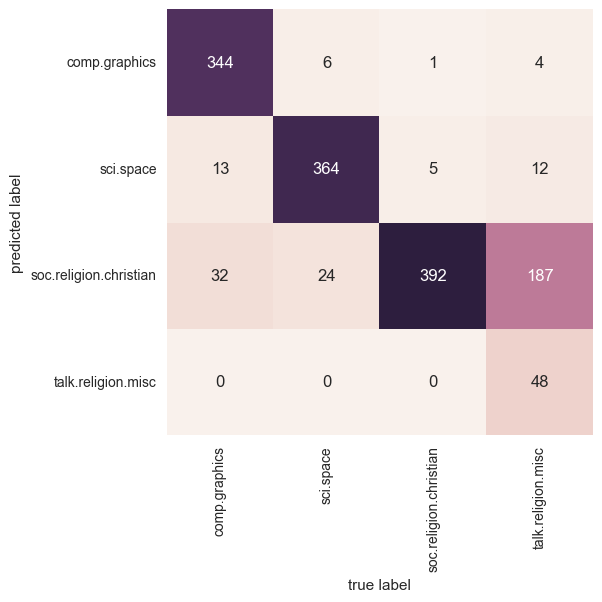

In [46]:
from sklearn.metrics import confusion_matrix
mat = confusion_matrix(test.target, labels)
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,
                xticklabels=train.target_names, yticklabels=train.target_names)
plt.xlabel('true label')
plt.ylabel('predicted label');

We can also give the model a string and using the predict method see if it can assign it to a category. This might be the main point of a social science application.

In [47]:
def predict_category(s, train=train, model=model): #We just define a simple function here
    return train.target_names[model.predict([s])]

In [48]:
predict_category('rockets')

C:\Users\Shilin\Anaconda2\lib\site-packages\ipykernel\__main__.py:2: VisibleDeprecationWarning: converting an array with ndim > 0 to an index will result in an error in the future
  from ipykernel import kernelapp as app


'sci.space'

Try it yourself with your own strings!


**Playtime**: Try altering the categories! See if you can come up with ones that are more/less likely to be confused. As an extension, you can use different feature extractors, e.g., CountVectorizer. This just turns each document into a vector of word counts. 

## Let's label these so we can interrogate them

In [49]:
train.target[0:6] #The target vector is just labels, so we need to turn that into real names. 
#Remember that train.target_names turns a label (number) into a real name

array([2, 2, 1, 2, 0, 3], dtype=int64)

In [50]:
train.target_names

['comp.graphics', 'sci.space', 'soc.religion.christian', 'talk.religion.misc']

In [51]:
train_target_name_vec = [train.target_names[tarlabel] for tarlabel in train.target] #Get vector of the names

In [52]:
train_target_name_vec[0:6]

['soc.religion.christian',
 'soc.religion.christian',
 'sci.space',
 'soc.religion.christian',
 'comp.graphics',
 'talk.religion.misc']

In [53]:
print(train.data[5])

From: dmcgee@uluhe.soest.hawaii.edu (Don McGee)
Subject: Federal Hearing
Originator: dmcgee@uluhe
Organization: School of Ocean and Earth Science and Technology
Distribution: usa
Lines: 10


Fact or rumor....?  Madalyn Murray O'Hare an atheist who eliminated the
use of the bible reading and prayer in public schools 15 years ago is now
going to appear before the FCC with a petition to stop the reading of the
Gospel on the airways of America.  And she is also campaigning to remove
Christmas programs, songs, etc from the public schools.  If it is true
then mail to Federal Communications Commission 1919 H Street Washington DC
20054 expressing your opposition to her request.  Reference Petition number

2493.



Now let's look at the feature vectors for individual documents. As far as I can tell you need to write a function for this...

In [54]:
vectorizer = TfidfVectorizer() #Need to create an instance of this separately. 
#vectorizer = CountVectorizer()

In [55]:
vectorized = vectorizer.fit_transform(train.data) #This creates the feature matrix. 

In [56]:
vectorizer.get_feature_names()[4000:4005]

[u'abide', u'abideth', u'abiding', u'abigail', u'abild']

In [57]:
vectorizer.vocabulary_.get('space')

29787

In [58]:
def feature_vector(vectorized,vectorizer,i): #Need to pass this your trained vectorizer, plus the feature matrix
    feature_name_vec = vectorizer.get_feature_names() #Pull out the vector of feature names from vectorizer
    raw_vec = vectorized.toarray()[i] #Grab the correct row from the feature matrix (turn to array b/c it's sparse)
    feat_vec = [] #This is where we put the results
    for j,line in enumerate(raw_vec): #Iterate through the row of the feature matrix
        if line > 0.: #Most will be zero...
            word = feature_name_vec[j] #If not, pull the actual word
            feat_vec.append([word,line]) #Append the word and the prob
    return feat_vec
    

In [59]:
test_vec = feature_vector(vectorized,vectorizer,5)

In [60]:
test_vec

[[u'10', 0.059094640007419402],
 [u'15', 0.060070560779401233],
 [u'1919', 0.13813124311823219],
 [u'20054', 0.14358316256425113],
 [u'2493', 0.14358316256425113],
 [u'ago', 0.071868241725587187],
 [u'airways', 0.14358316256425113],
 [u'also', 0.043588832578079433],
 [u'america', 0.093569868889512922],
 [u'an', 0.035915548362103117],
 [u'and', 0.088535500110212759],
 [u'appear', 0.087782521282287612],
 [u'atheist', 0.089161398092759137],
 [u'before', 0.056372954244153173],
 [u'bible', 0.060381243087647349],
 [u'campaigning', 0.14358316256425113],
 [u'christmas', 0.11896019559696268],
 [u'commission', 0.11579432083476432],
 [u'communications', 0.08208287025157307],
 [u'dc', 0.087452926951007579],
 [u'distribution', 0.054331930927452463],
 [u'dmcgee', 0.28716632512850226],
 [u'don', 0.041252958720361832],
 [u'earth', 0.060937502621273981],
 [u'edu', 0.02655622694293967],
 [u'eliminated', 0.1304471942349025],
 [u'etc', 0.060459716062572312],
 [u'expressing', 0.12276314535157286],
 [u'fact

In [278]:
print(train.data[5])

From: dmcgee@uluhe.soest.hawaii.edu (Don McGee)
Subject: Federal Hearing
Originator: dmcgee@uluhe
Organization: School of Ocean and Earth Science and Technology
Distribution: usa
Lines: 10


Fact or rumor....?  Madalyn Murray O'Hare an atheist who eliminated the
use of the bible reading and prayer in public schools 15 years ago is now
going to appear before the FCC with a petition to stop the reading of the
Gospel on the airways of America.  And she is also campaigning to remove
Christmas programs, songs, etc from the public schools.  If it is true
then mail to Federal Communications Commission 1919 H Street Washington DC
20054 expressing your opposition to her request.  Reference Petition number

2493.



## Now an a more relevant content analysis example

In [2]:
polpath = r"/Users/jevans/Desktop/CAdata/Baseline/*/*" #Wildcards

In [12]:
from bunch import *

In [281]:
def get_subject_dataP(path):

    datacomplex = Bunch()
    datacomplex['description']='Floor speeches from Congressional establishment Republicans & Tea Partyers'    
    datacomplex['target_names'] = ['establishment', 'teaparty']
    filenames = []
    data = []
    target = []
    
    for fn in glob.glob(path):
        filenames.append(fn)
        file = open(fn,'r')
        data.append(file.read())
        if "clinton" in fn:
            target.append('0')
        elif "lott" in fn:
            target.append('1')
        elif "obama" in fn:
            target.append('2')
        
    datacomplex['filenames']=filenames
    datacomplex['data']=data
    datacomplex['target']=np.array(target)
    
    return datacomplex

In [282]:
releases = get_subject_dataP(polpath)

In [283]:
len(releases['target'])

3702

In [284]:
releases

Bunch(data=['April 10  2006 Senator Clinton Introduces Legislation To Help Seniors Meet Their Long Term Care Needs At Home And In Their Communities                                                                                                                                                                                                                                                                                          Washington  DC    Senator Hillary Rodham Clinton has introduced legislation to help older Americans have greater choice in long term care services   The Community Based Choices for Older Americans Act will assist individuals age 60 or older who grapple with daily living activities or with a disability  yet are above a state  s Medicaid eligibility threshold  in meeting their long term care needs            As I talk with seniors around New York and across the country  what I hear most is that they want to stay in their homes as long as they can   However  too many 

In [285]:
model.fit(releases.data,releases.target)

Pipeline(steps=[('tfidfvectorizer', TfidfVectorizer(analyzer=u'word', binary=False, decode_error=u'strict',
        dtype=<type 'numpy.int64'>, encoding=u'utf-8', input=u'content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 1), norm=u'l2', preprocessor=None, smoo...   vocabulary=None)), ('multinomialnb', MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True))])

In [286]:
labels = model.predict(releases.data)

In [287]:
labels

array(['0', '0', '0', ..., '0', '2', '2'], 
      dtype='|S1')

In [288]:
def predict_category(s, train=releases, model=model): #We just define a simple function here
    return train.target_names[model.predict([s])]

In [289]:
model.fit_transform

<bound method Pipeline.fit_transform of Pipeline(steps=[('tfidfvectorizer', TfidfVectorizer(analyzer=u'word', binary=False, decode_error=u'strict',
        dtype=<type 'numpy.int64'>, encoding=u'utf-8', input=u'content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 1), norm=u'l2', preprocessor=None, smoo...   vocabulary=None)), ('multinomialnb', MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True))])>

In [1]:
predict_category('matplotlib is awesome')

NameError: name 'predict_category' is not defined

# DECISION TREES

We are going to stick to Scikit-Learn here.

In [64]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns; sns.set()

Decision trees can be used to predict both categorical/class labels (i.e., classification) and continuous labels (i.e., regression).

Let's create something to learn:

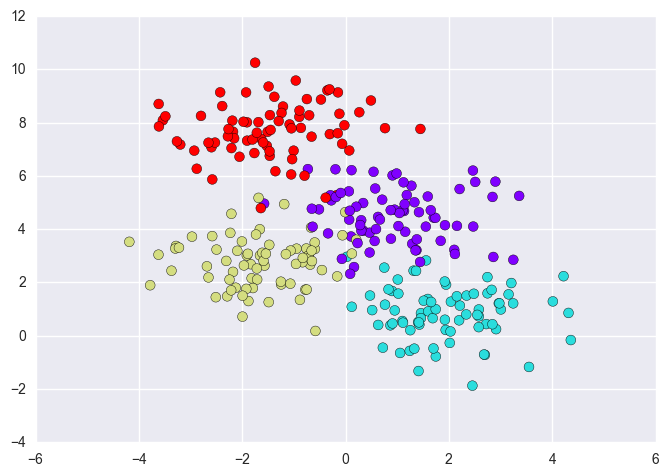

In [65]:
from sklearn.datasets import make_blobs
X, y = make_blobs(n_samples=300, centers=4,
                random_state=0, cluster_std=1.0)
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='rainbow');

Now we import our Decision Tree classifier from sklearn.tree (very familiar syntax!) and fit it using the fit method.

In [66]:
from sklearn.tree import DecisionTreeClassifier
tree = DecisionTreeClassifier(max_depth=4,random_state=0).fit(X,y)

To see what's going on visually with the classification, we can use this (complex) visualizer. 

In [67]:
def visualize_classifier(model, X, y, Xmod, ymod, ax=None, cmap='rainbow'): #X and y are plotted; Xmod and ymod train
    ax = ax or plt.gca()
    # Plot the training points
    ax.scatter(X[:, 0], X[:, 1], c=y, s=30, cmap=cmap,
               clim=(y.min(), y.max()), zorder=3)
    ax.axis('tight')
    ax.axis('off')
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    # fit the estimator
    model.fit(Xmod, ymod)
    xx, yy = np.meshgrid(np.linspace(*xlim, num=200),
                         np.linspace(*ylim, num=200))
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)
    # Create a color plot with the results
    n_classes = len(np.unique(y))
    contours = ax.contourf(xx, yy, Z, alpha=0.3,
                           levels=np.arange(n_classes + 1) - 0.5,
                           cmap=cmap, clim=(y.min(), y.max()),
                           zorder=1)
    ax.set(xlim=xlim, ylim=ylim)

Xnew, ynew = make_blobs(n_samples=1000, centers=4,
                random_state=0, cluster_std=1.0)

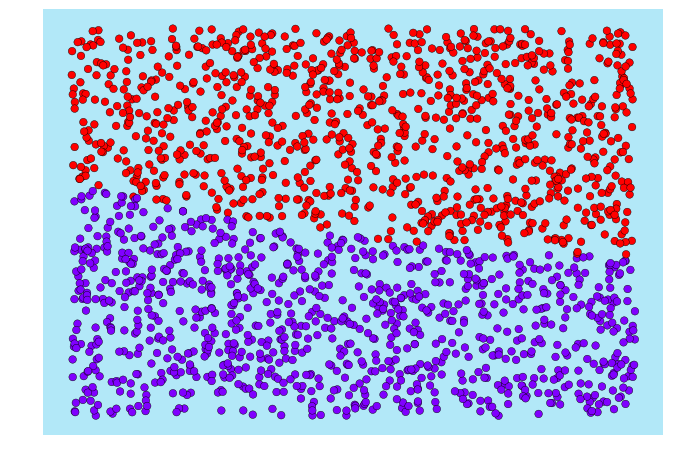

In [68]:
visualize_classifier(DecisionTreeClassifier(max_depth=1,random_state=0), Xnew, ynew, X, y) #We train on the full data

In [69]:
from sklearn.metrics import accuracy_score, precision_score, recall_score
accuracy_score(ynew,DecisionTreeClassifier(max_depth=10,random_state=0).fit(X,y).predict(Xnew))

0.26350000000000001

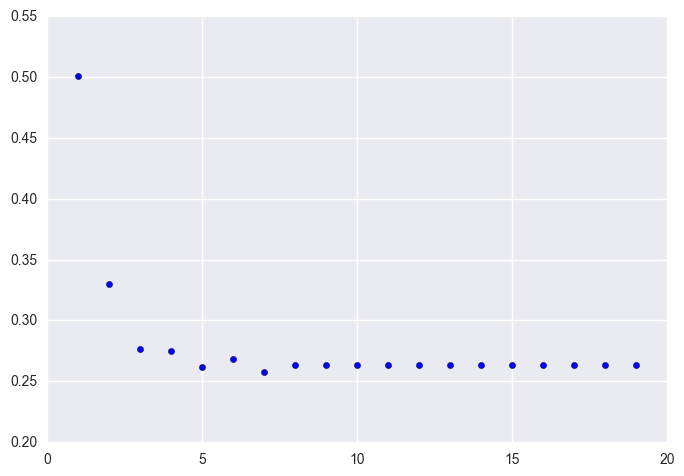

In [70]:
depthvec = []
scorevec = []
for i in range(1,20):
    tree2 = DecisionTreeClassifier(max_depth=i,random_state=0).fit(X,y)
    score = accuracy_score(ynew,tree2.predict(Xnew))
    depthvec.append(i)
    scorevec.append(score)
plt.scatter(depthvec,scorevec)

Near the cluster boundaries, the shape is pretty weird. Overfitting!

In [71]:
from sklearn.cross_validation import train_test_split #Can use this to split the data
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size=0.5,random_state=1) #test_size means a 50/50 split
print(len(X))
print(len(Xtrain))
print(len(Xtest))

300
150
150


With some abuse of notation, we can use the visualizer to plot first a classifier trained on the "training" half of the data.

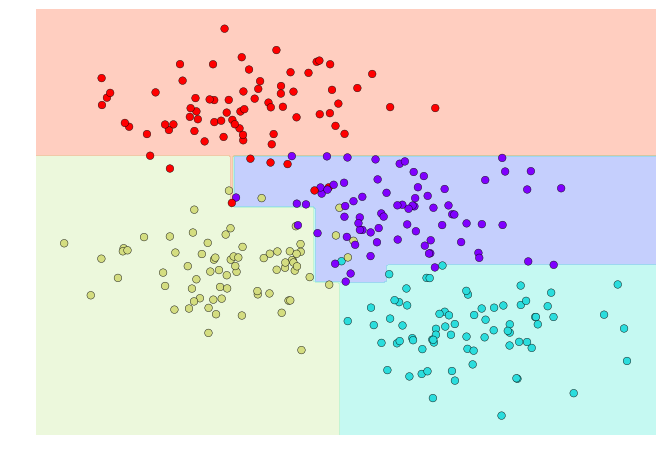

In [72]:
visualize_classifier(DecisionTreeClassifier(max_depth=5,random_state=0), X, y, Xtrain, ytrain) #Train with half the data

Now we can train on the second half of the data--allegedly the test data--to see how different training sets affect the decision boundaries.

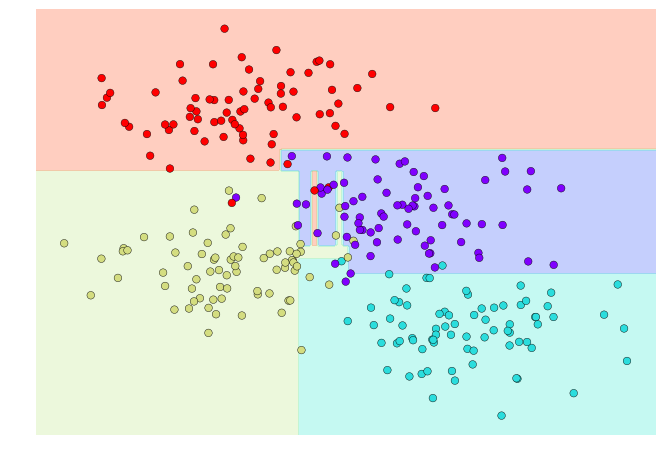

In [73]:
visualize_classifier(DecisionTreeClassifier(random_state=0), X, y, Xtest, ytest) #Train with other half of the data

Finally, we can get a sense of the performance by training on the training data, but PLOTTING the test data

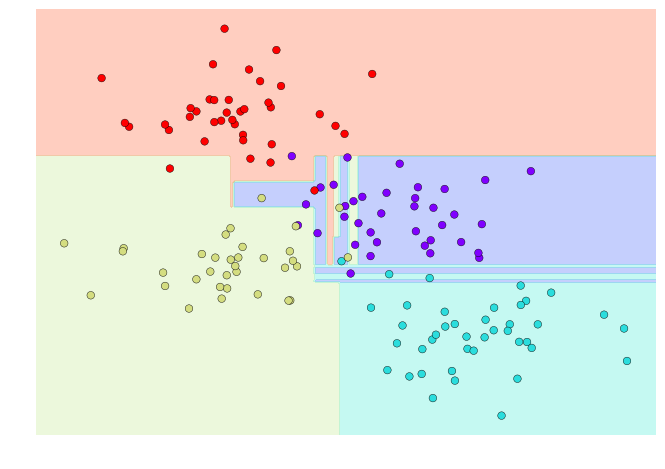

In [74]:
visualize_classifier(DecisionTreeClassifier(), Xtest, ytest, Xtrain, ytrain) #Trains with train data, plots test data

Combining multiple overfitting estimators turns out to be a key idea in machine learning. This is called **bagging** and is a type of **ensemble** method. The idea is to make many randomized estimators--each can overfit, as decision trees are wont to do--but then to combine them, ultimately producing a better classification. A **random forest** is produced by bagging decision trees.

In [75]:
from sklearn.tree import DecisionTreeClassifier  #Just in case
from sklearn.ensemble import BaggingClassifier #The bagging

tree = DecisionTreeClassifier(max_depth=10) #Create an instance of our decision tree classifier.

bag = BaggingClassifier(tree, n_estimators=100, max_samples=0.8, random_state=1) #Each tree uses up to 80% of the data

In [76]:
?BaggingClassifier #Learn more

In [77]:
bag.fit(X,y) #Fit the bagged classifier

BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=10,
            max_features=None, max_leaf_nodes=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=None, splitter='best'),
         bootstrap=True, bootstrap_features=False, max_features=1.0,
         max_samples=0.8, n_estimators=100, n_jobs=1, oob_score=False,
         random_state=1, verbose=0, warm_start=False)

In [78]:
Xnew, ynew = make_blobs(n_samples=10000, centers=4,
                random_state=0, cluster_std=1.0)

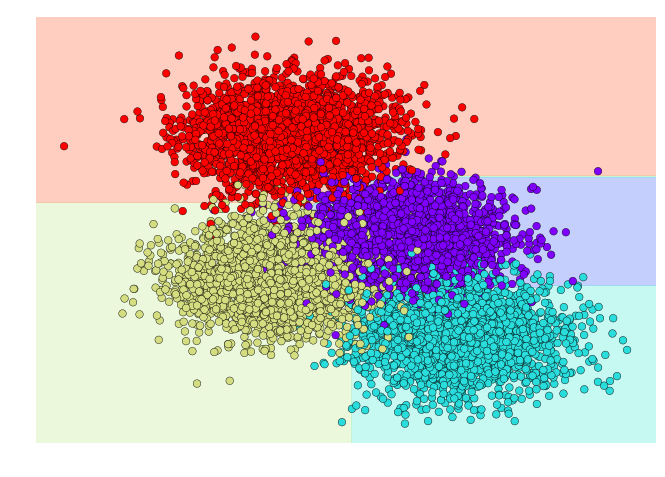

In [79]:
visualize_classifier(bag,Xnew,ynew,X,y) #And visualize
#Remember we can give the full data as training data, as bag automatically splits and trains

In [80]:
from sklearn.metrics import accuracy_score, precision_score, recall_score
recall_score(ynew,bag.predict(Xnew),average='weighted')

0.9204

## Brief aside: Random forest regression

First, let's create a challenging dataset.

In [81]:
rng = np.random.RandomState(42)
x = 10 * rng.rand(200) #200 uniformly distributed random numbers between 0 and 10
def model(x, sigma=0.3): 
    fast_oscillation = np.sin(5 * x) 
    slow_oscillation = np.sin(0.5 * x)
    noise = sigma * rng.randn(len(x)) #Create 200 random numbers, normally distributed

    return slow_oscillation + fast_oscillation + noise

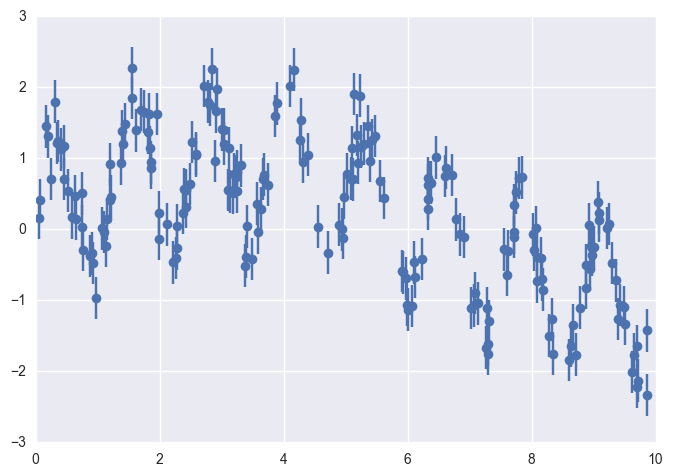

In [82]:
y = model(x)
plt.errorbar(x, y, 0.3, fmt='o'); #Shows one std around point
#plt.scatter(x, y); #Plots the actual points

First we will try to learn this with something simple; a single decision tree, but one that is a regressor, not a classifier.

In [83]:
#First try to learn this with something simple --  a single decision tree regressor
from sklearn.tree import DecisionTreeRegressor

# Fit regression models
regr_1 = DecisionTreeRegressor(max_depth=2)
regr_2 = DecisionTreeRegressor(max_depth=5)
regr_3 = DecisionTreeRegressor(max_depth=10)
regr_1.fit(x[:,None], y)
regr_2.fit(x[:,None], y)
regr_3.fit(x[:,None], y)

# Predict
xfit = np.linspace(0, 10, 1000)
yfit_1 = regr_1.predict(xfit[:, None]) #xfit[:,None] is a work-around to pass a 1d feature matrix
yfit_2 = regr_2.predict(xfit[:, None])
yfit_3 = regr_3.predict(xfit[:, None])

Let's see how these two decision trees do... What do you think will happen as we add depth?

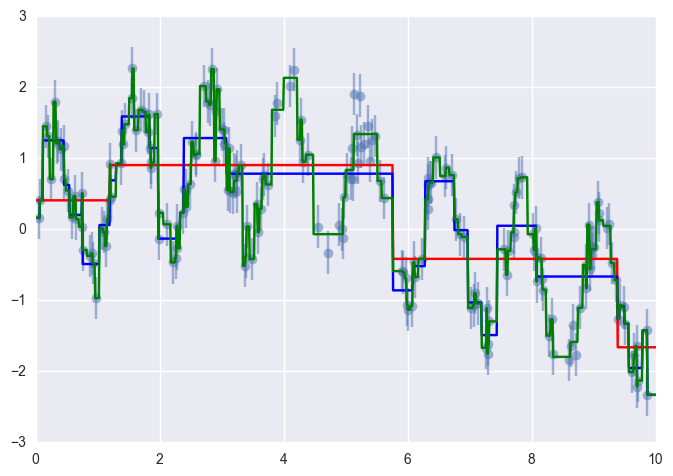

In [84]:
plt.errorbar(x, y, 0.3, fmt='o', alpha=0.5)
plt.plot(xfit, yfit_1, '-r'); #depth = 2
plt.plot(xfit,yfit_2,'-b'); #depth = 5
plt.plot(xfit,yfit_3,'-g'); #depth = 10

Or we can use a **random forest regressor**

In [85]:
from sklearn.ensemble import RandomForestRegressor 
forest = RandomForestRegressor(200) 
forest.fit(x[:, None], y)
    
yfit = forest.predict(xfit[:, None]) #Predictions of the forest model
ytrue = model(xfit, sigma=0) #This is the underlying data, no noise

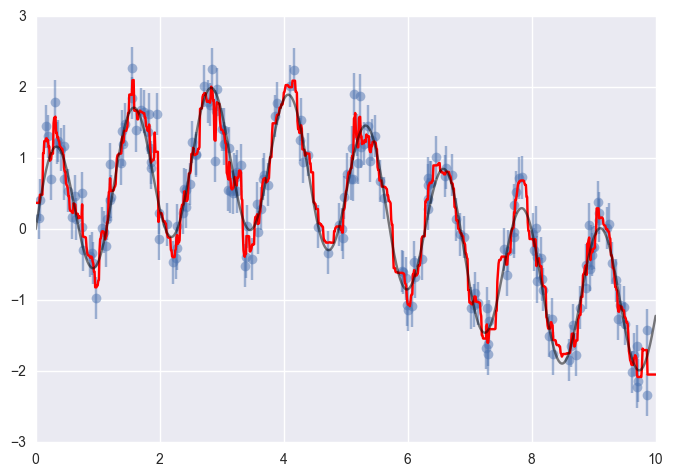

In [86]:
plt.errorbar(x, y, 0.3, fmt='o', alpha=0.5)
plt.plot(xfit, yfit, '-r');
plt.plot(xfit, ytrue, '-k', alpha=0.5);

A beautiful fit of the underlying pattern... a lot of the noise has been washed out. This is the power of bagging.

# K-MEANS

Remember the basic goal of k-means: we want to partition our input data into a set of $k$ clusters, $\textbf{S} = \{S_1,\dots,S_k\}$ such that we minimize the sum of squared distances from each point in a cluster to the center of its assigned cluster, i.e., $\arg\min_S \sum_{i=1}^{k}\sum_{\textbf{x} \in S_i} \| \textbf{x} - \mathbf{\mu}_i \|^{2}$

We can approximately solve this using a very simple E-M (Expectation-Maximization) algorithm. The basic idea is:

1. Pick the number of clusters

2. Randomly choose initial cluster centers

3. Repeat until converged
    1. assign points to nearest cluster center (E-step)
    2. set the cluster centers to the mean (M-step) 

Here is one nearly "from scratch" implementation, from *The Python Data Science Handbook*

In [87]:
from sklearn.metrics import pairwise_distances_argmin #One little thing we'll import instead of writing up

def find_clusters(X, n_clusters, rseed=2): #STEP 1: Pick the number of clusters here; set the hyperparameter
    #STEP 2: Randomly choose initial cluster centers
    rng = np.random.RandomState(rseed)
    i = rng.permutation(X.shape[0])[:n_clusters] #X.shape[0] gives you the number of rows in the data, i.e. #points
    centers = X[i]
    
    while True: #STEP 3: Repeat until converged...
        # 3A. Assign labels based on closest center (E-step)
        labels = pairwise_distances_argmin(X, centers)
    
        # 3B. Find new centers from means of points (M-step)
        new_centers = np.array([X[labels == i].mean(0)
                                for i in range(n_clusters)]) #This goes through all clusters and computes means.
        # 3C. Check for convergence
        if np.all(centers == new_centers): 
            break #Stop if converged
        centers = new_centers #otherwise use the new centers
    
    return centers, labels

Let's test it out!

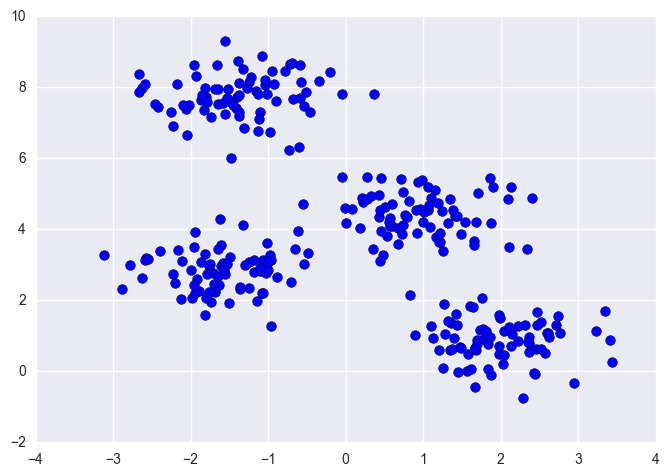

In [88]:
from sklearn.datasets.samples_generator import make_blobs 
X, y_true = make_blobs(n_samples=300, centers=4,
                       cluster_std=0.60, random_state=0)
plt.scatter(X[:, 0], X[:, 1], s=50);

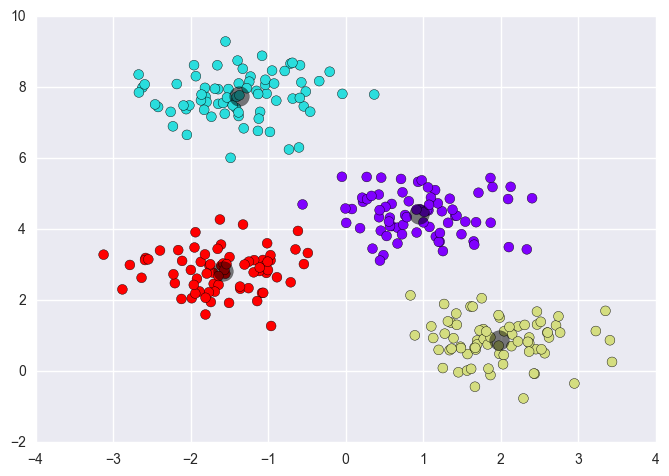

In [89]:
centers, labels = find_clusters(X, 4)
plt.scatter(X[:, 0], X[:, 1], c=labels,
            s=50, cmap='rainbow');
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5);

Of course there is a way to do this in Scikit-Learn:

In [90]:
from sklearn.cluster import KMeans 
kmeans = KMeans(n_clusters=4) 
kmeans.fit(X)
y_kmeans = kmeans.predict(X)

Let's plot this!

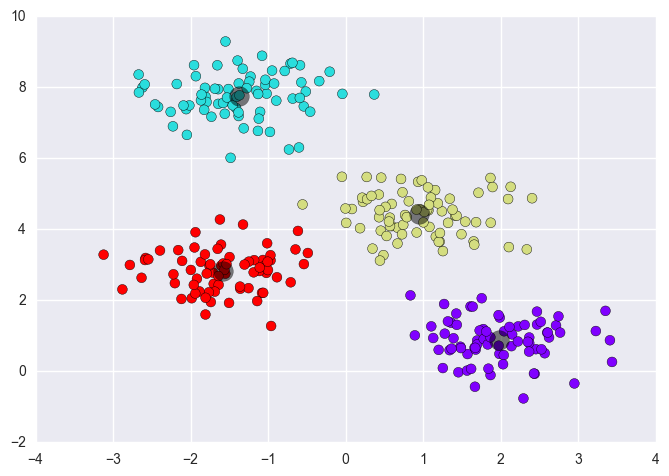

In [91]:
plt.scatter(X[:, 0], X[:, 1], c=y_kmeans, s=50, cmap='rainbow')
centers2 = kmeans.cluster_centers_
plt.scatter(centers2[:, 0],centers2[:, 1], c='black', s=200, alpha=0.5);

But there are some issues with E-M.

Issue 1) You may not find the global optimum, because this is a heuristic algorithm!

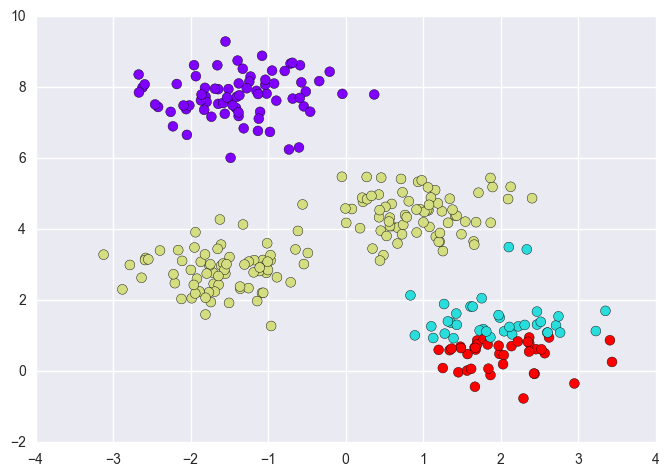

In [92]:
centers, labels = find_clusters(X, 4, rseed=0) #Set different seed, so it picks different starting points
plt.scatter(X[:, 0], X[:, 1], c=labels,
            s=50, cmap='rainbow');

Ugh! So you usually want to run this a few times. 

Issue 2. You have to select the number of clusters beforehand (i.e., it has a hyperparameter). K-means doesn't know how to learn the number of clusters from the data. For example...

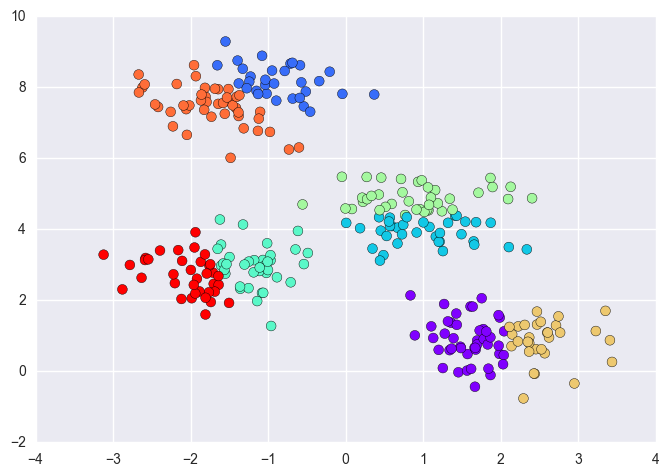

In [93]:
labels = KMeans(8, random_state=0).fit_predict(X)
plt.scatter(X[:, 0], X[:, 1], c=labels,
            s=50, cmap='rainbow');

There are many ways to solve this; one of the simplest is called silhouette analysis. 

Automatically created module for IPython interactive environment
For n_clusters = 2 The average silhouette_score is : 0.542642229736


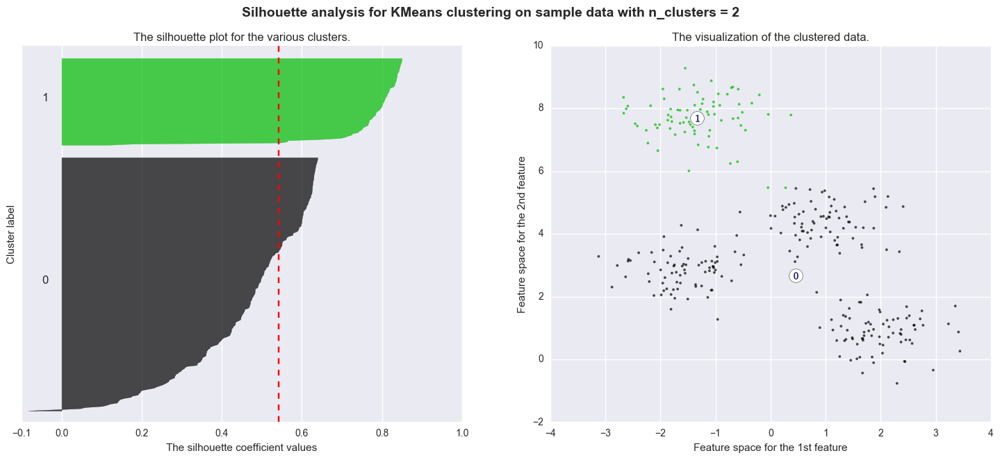

For n_clusters = 3 The average silhouette_score is : 0.589039039355


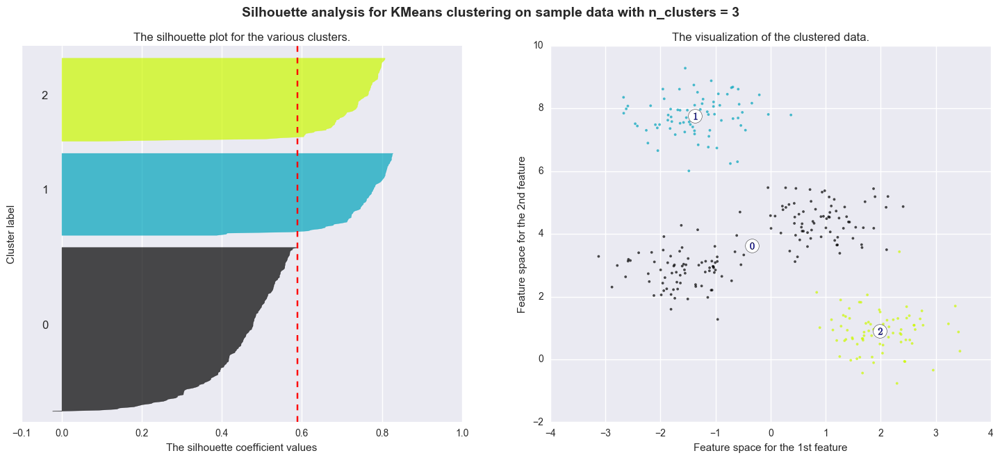

For n_clusters = 4 The average silhouette_score is : 0.681993869064


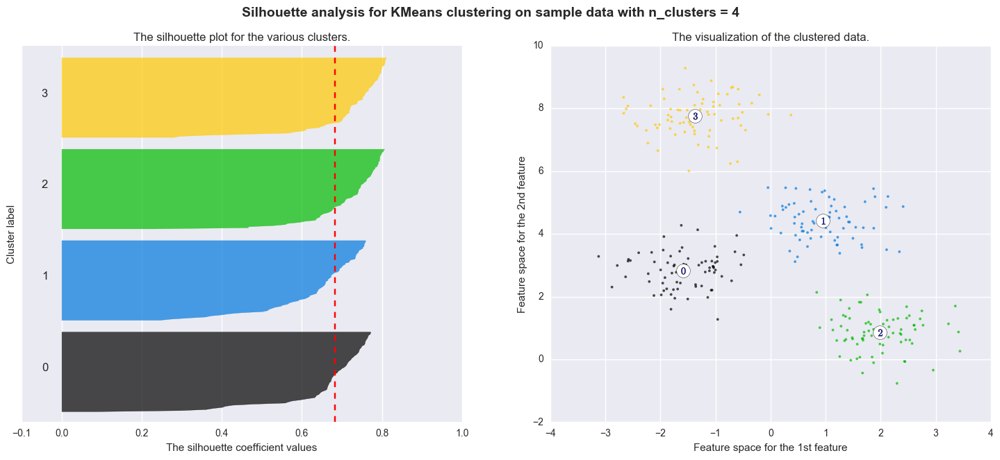

For n_clusters = 5 The average silhouette_score is : 0.592387514876


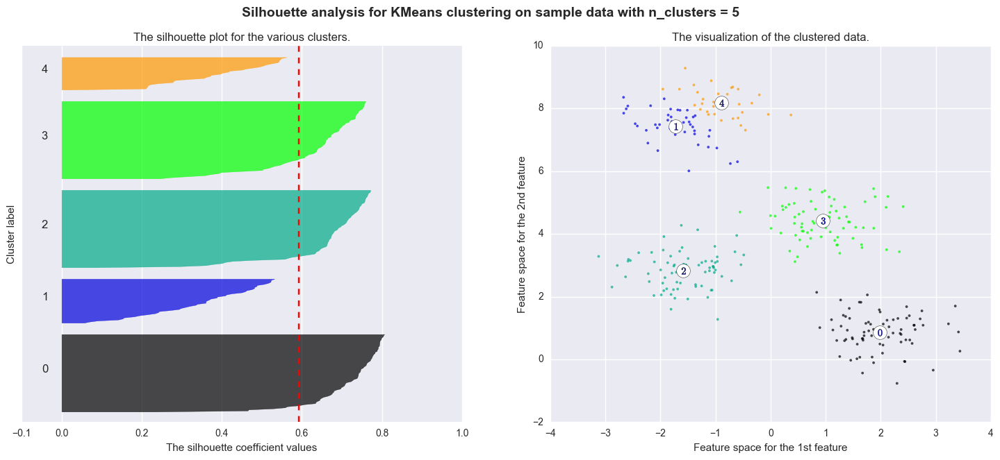

For n_clusters = 6 The average silhouette_score is : 0.499345044059


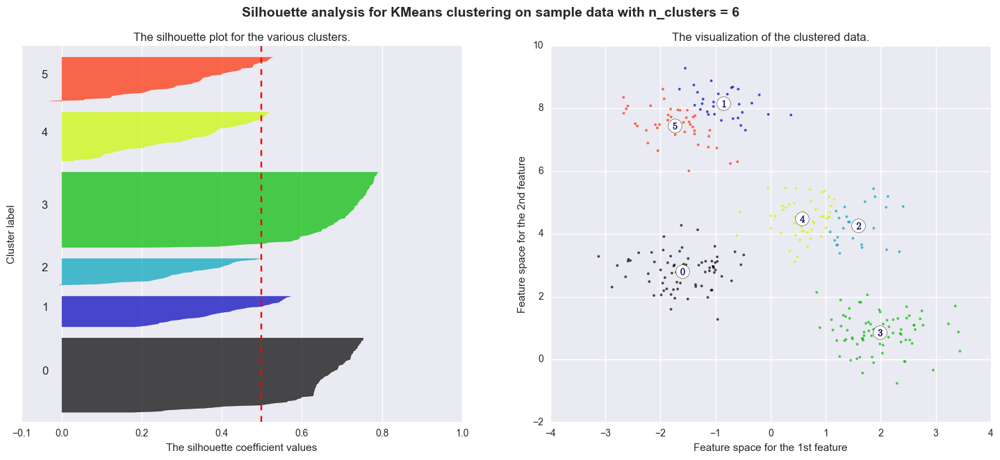

In [94]:
#See: http://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html 
from __future__ import print_function

from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

print(__doc__)

# Generating the sample data from make_blobs
# This particular setting has one distict cluster and 3 clusters placed close
# together.
X, y = make_blobs(n_samples=300, centers=4,
                       cluster_std=0.60, random_state=0)
range_n_clusters = [2, 3, 4, 5, 6]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhoutte score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors)

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1],
                marker='o', c="white", alpha=1, s=200)

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50)

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

    plt.show()

Issue 3. It is also limited to linear cluster boundaries (this has to do with the cluster criterion). But we can easily find clusters that don't have linear boundaries...

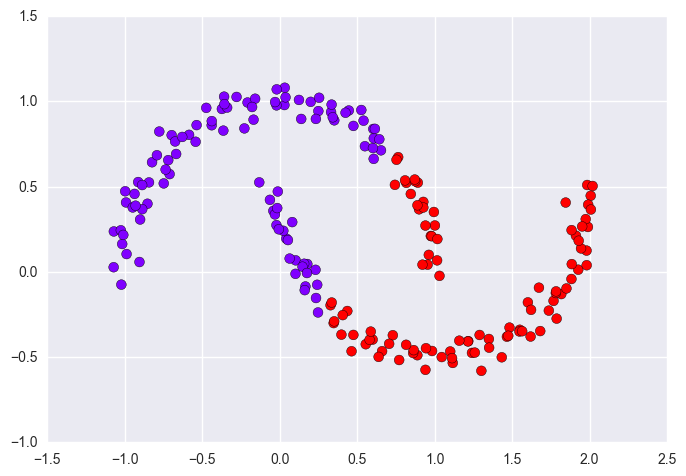

In [95]:
from sklearn.datasets import make_moons
X, y = make_moons(200, noise=.05, random_state=0)
labels = KMeans(2, random_state=0).fit_predict(X)
plt.scatter(X[:, 0], X[:, 1], c=labels,
            s=50, cmap='rainbow');

Remember that we often want to put data in a lower dimension; but sometimes putting data into a higher dimension can help. Using a kernel transformation we represent the data in higher dimensions, then use k-means. Scikit-Learn has a way to do this using Spectral Clustering.

C:\Users\Shilin\Anaconda2\lib\site-packages\sklearn\manifold\spectral_embedding_.py:217: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


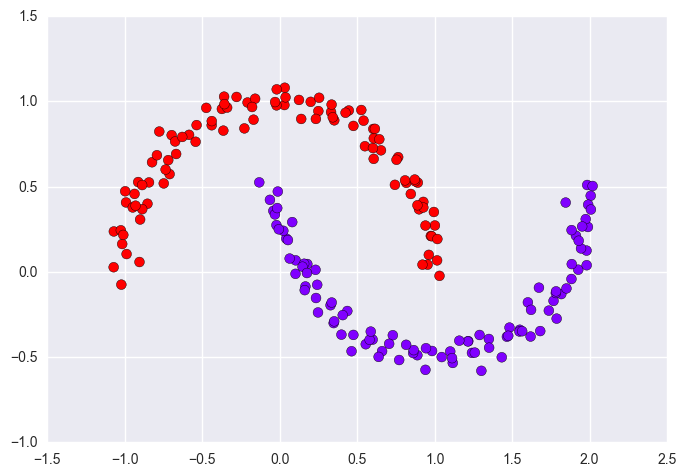

In [96]:
from sklearn.cluster import SpectralClustering
model = SpectralClustering(n_clusters=2, affinity='nearest_neighbors',
                           assign_labels='kmeans')
labels = model.fit_predict(X)
plt.scatter(X[:, 0], X[:, 1], c=labels,
            s=50, cmap='rainbow');

Can you do silhouette analysis on spectral clustering? I think yes?

Issue 4. k-means can be slow on big datasets (because we have to compute all those cluster distances and cluster averages at each step). There are ways to speed it up, e.g., by recomputing the centers from a random subset. This is called MiniBatch k-means. 

A fancier relative of k-means is the Gaussian Mixture Model. We will probably discuss that tomorrow.

Automatically created module for IPython interactive environment
For n_clusters = 2 The average silhouette_score is : 0.325853189502


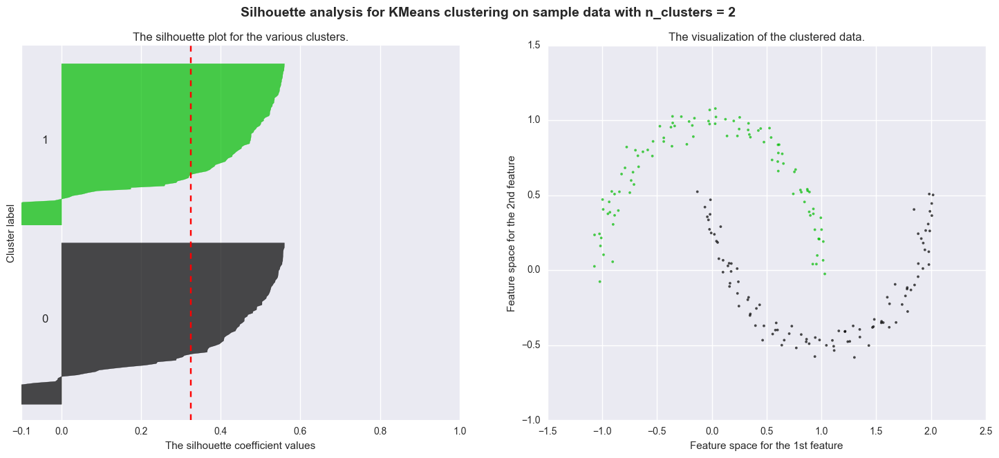

For n_clusters = 3 The average silhouette_score is : 0.325853189502


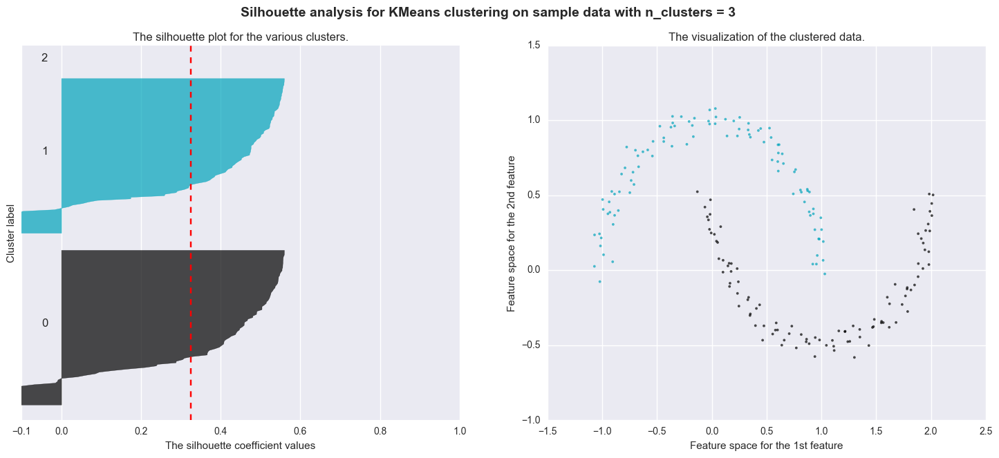

For n_clusters = 4 The average silhouette_score is : 0.325853189502


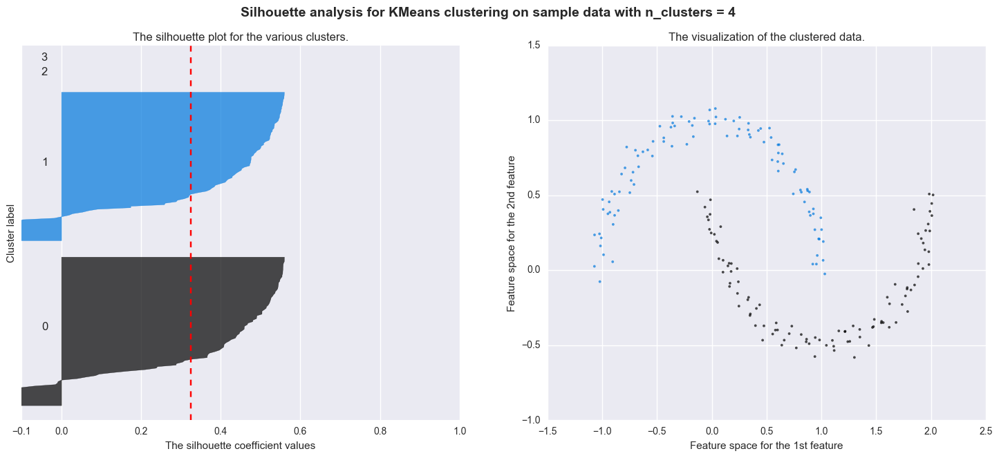

For n_clusters = 5 The average silhouette_score is : 0.325853189502


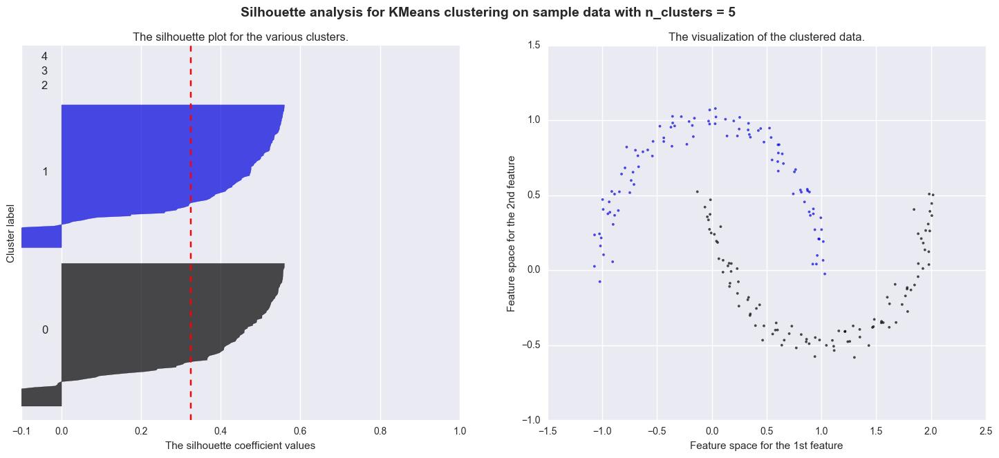

For n_clusters = 6 The average silhouette_score is : 0.325853189502


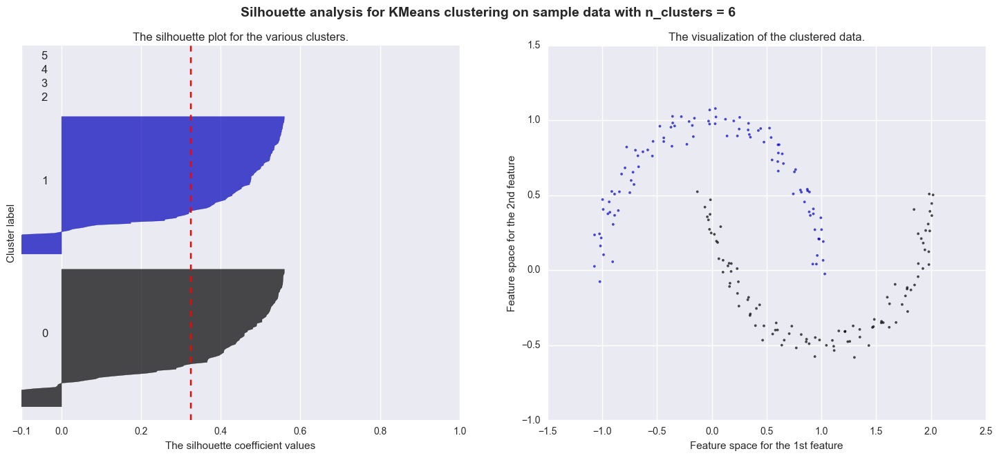

In [97]:
#See: http://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html 
from __future__ import print_function

from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

print(__doc__)

# Generating the sample data from make_blobs
# This particular setting has one distict cluster and 3 clusters placed close
# together.
X, y = make_moons(200, noise=.05, random_state=0)
labels = KMeans(2, random_state=0).fit_predict(X)

range_n_clusters = [2, 3, 4, 5, 6]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = SpectralClustering(n_clusters=2, affinity='nearest_neighbors',
                           assign_labels='kmeans',random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhoutte score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors)

    # Labeling the clusters
    #centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    #ax2.scatter(centers[:, 0], centers[:, 1],
               # marker='o', c="white", alpha=1, s=200)

    #for i, c in enumerate(centers):
        #ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50)

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

    plt.show()